### IMPORTS

In [ ]:
import os
import cv2
import pathlib
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn import preprocessing
from keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, GlobalAveragePooling2D, Dropout
from keras import Sequential
from keras.layers import Rescaling, RandomRotation, RandomWidth, RandomHeight, RandomZoom, RandomFlip, Resizing
from keras.applications import ResNet50
from keras.losses import SparseCategoricalCrossentropy
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint

### DOWNLOADING DATASET FROM KAGGLE

In [ ]:
## We needed to remove 1 class so not using this method

# from google.colab import files

# # Kaggle API token JSON file
# uploaded = files.upload()

In [ ]:
# !mkdir -p ~/.kaggle
# !mv kaggle.json ~/.kaggle/
# !chmod 600 ~/.kaggle/kaggle.json

# !kaggle datasets download -d haroonalam16/20-skin-diseases-dataset

# !unzip 20-skin-diseases-dataset.zip

### LOADING DATASET

In [ ]:
batch_size = 32     #Steps per epoch are set to len(x_train), for batch size of x, I will have x times the original data
img_height = 224
img_width = 224     # Resolution for Resnet-50 is 224
epochs=20
num_classes = 19

AUTOTUNE = tf.data.AUTOTUNE
# TensorFlow will dynamically adjust the level of parallelism based on available CPU resources and the
# overall execution profile of the input pipeline.

In [ ]:
from keras.utils import image_dataset_from_directory

training_ds = image_dataset_from_directory(
    '/content/drive/MyDrive/Datasets/20SkinDataset/train',
    labels="inferred",
    label_mode="categorical",
    color_mode="rgb",
    batch_size=batch_size,
    image_size=(img_height, img_width),
    shuffle=True,
    seed=7,
    validation_split=0.2,
    subset="training",
    interpolation="bilinear",
    follow_links=False,
    crop_to_aspect_ratio=False,
)

val_ds = image_dataset_from_directory(
    '/content/drive/MyDrive/Datasets/20SkinDataset/train',
    labels="inferred",
    label_mode="categorical",
    color_mode="rgb",
    batch_size=batch_size,
    image_size=(img_height, img_width),
    shuffle=True,
    seed=7,
    validation_split=0.2,
    subset="validation",     # training subset
    interpolation="bilinear",
    follow_links=False,
    crop_to_aspect_ratio=False,
)

# testing_ds = image_dataset_from_directory(
#     '/content/Dataset/test',
#     labels='inferred',
#     label_mode='categorical',
#     color_mode="rgb",
#     batch_size=batch_size,
#     image_size=(img_height, img_height),
#     shuffle=True,
#     seed=7,
#     interpolation="bilinear",
#     follow_links=False,
#     crop_to_aspect_ratio=False,
# )



# image_dataset_from_directory yields a tuple (images, labels),
#   where images has shape (batch_size, image_size[0], image_size[1], num_channels),
#   and labels follows the format described below.

# if label_mode is "categorical", the labels are a float32 tensor of shape (batch_size, num_classes),
#   representing a one-hot encoding of the class index.

Found 2609 files belonging to 19 classes.
Found 2609 files belonging to 19 classes.
Using 521 files for validation.


In [ ]:
print(type(training_ds))
print()     #spacing is gut :)
print(training_ds)

<class 'tensorflow.python.data.ops.prefetch_op._PrefetchDataset'>

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 19), dtype=tf.float32, name=None))>


In [ ]:
tr_classes = training_ds.class_names
print(tr_classes)

# te_classes = testing_ds.class_names
# print(te_classes)

['Acne and Rosacea Photos', 'Actinic Keratosis Basal Cell Carcinoma and other Malignant Lesions', 'Atopic Dermatitis Photos', 'Cellulitis Impetigo and other Bacterial Infections', 'Eczema Photos', 'Exanthems and Drug Eruptions', 'Herpes HPV and other STDs Photos', 'Light Diseases and Disorders of Pigmentation', 'Lupus and other Connective Tissue diseases', 'Melanoma Skin Cancer Nevi and Moles', 'Poison Ivy Photos and other Contact Dermatitis', 'Psoriasis pictures Lichen Planus and related diseases', 'Seborrheic Keratoses and other Benign Tumors', 'Systemic Disease', 'Tinea Ringworm Candidiasis and other Fungal Infections', 'Urticaria Hives', 'Vascular Tumors', 'Vasculitis Photos', 'Warts Molluscum and other Viral Infections']


In [ ]:
training_ds.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 19), dtype=tf.float32, name=None))

### OBSERVING DATA

#### 1

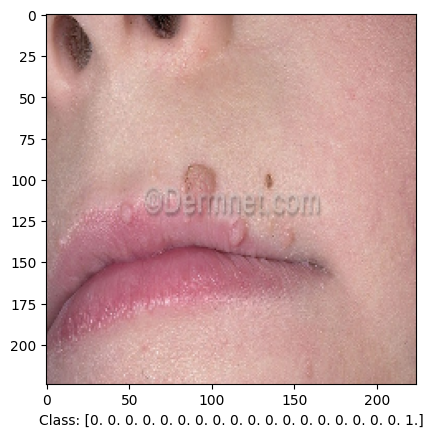

In [ ]:
for images, labels in training_ds.take(1):        # Display the first image from the batch
    plt.imshow(images[0].numpy().astype("uint8"))
    plt.xlabel(f"Class: {labels[0].numpy()}")
    plt.show()
    break

#### 2


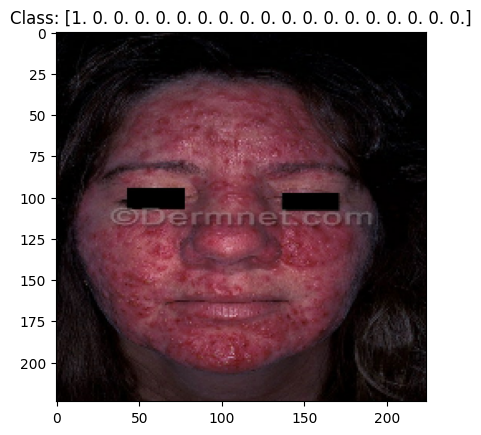

In [ ]:
sample_ds = training_ds.shuffle(buffer_size=1, seed=7)
# Iterate through the dataset
for images, labels in sample_ds:
    # Access the second image and label
    random1m = images[1]
    random1a = labels[1]

    # Display the image and label
    plt.imshow(random1m.numpy().astype("uint8"))
    plt.title(f"Class: {random1a.numpy()}")
    plt.show()
    break

#### 3

32


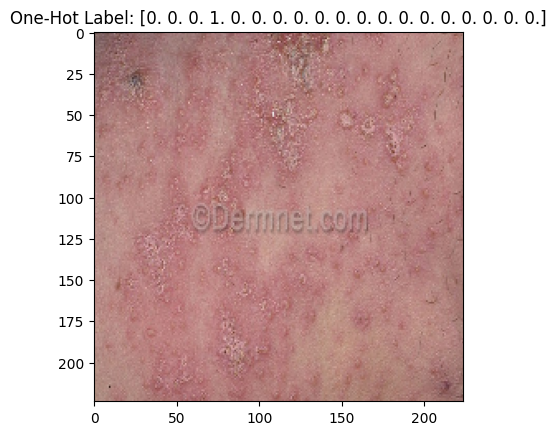

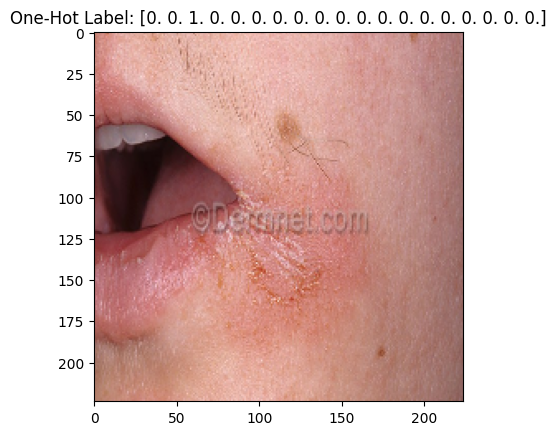

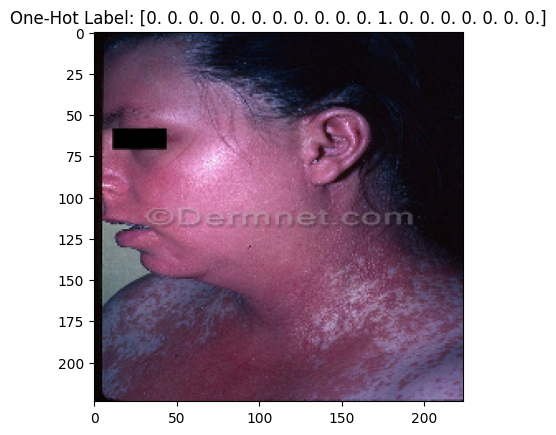

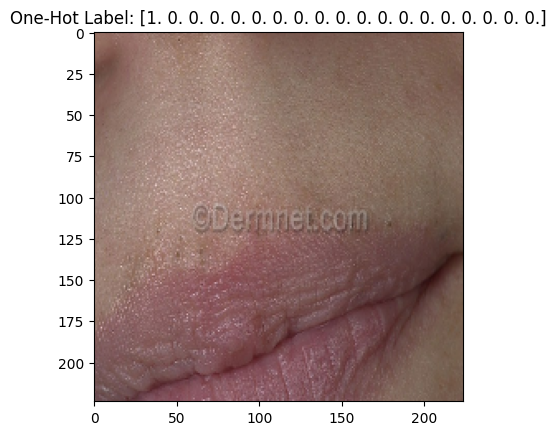

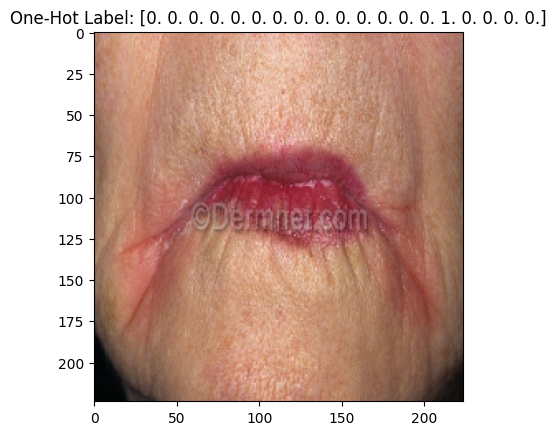

...

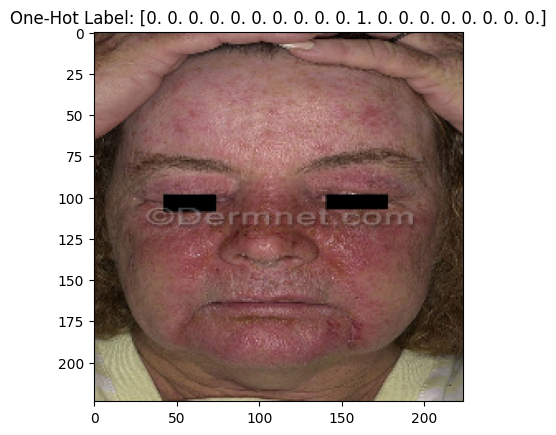

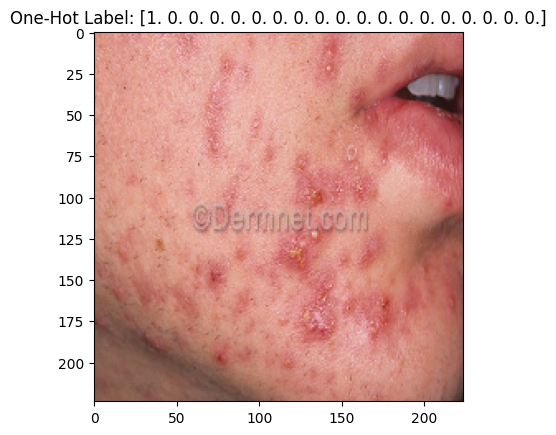

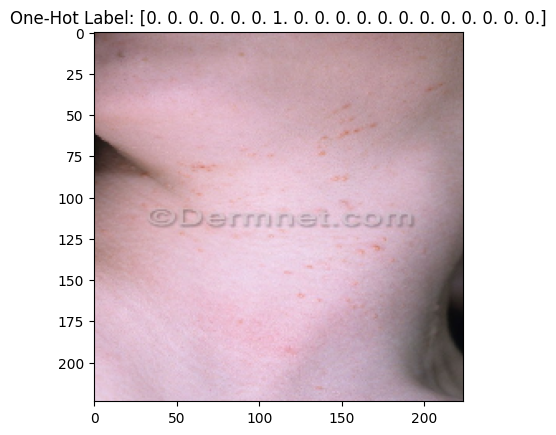

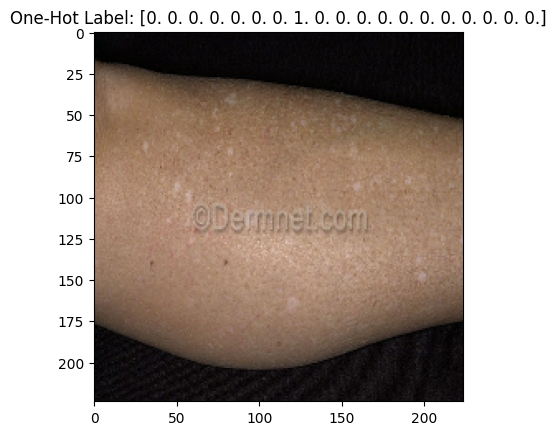

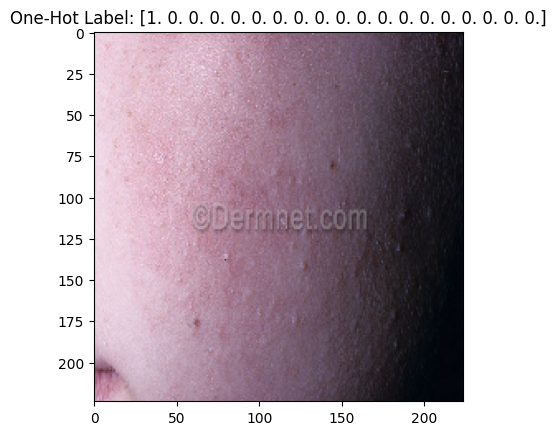

In [ ]:
for images, labels in training_ds.take(1):
  print(images.shape[0])
  for i in range(images.shape[0]):
      plt.imshow(images[i].numpy().astype("uint8"))
      plt.title(f"One-Hot Label: {labels[i].numpy()}")
      plt.show()

### DATA AUGMENTATION / PREPROCESSING LAYERS

In [ ]:
data_augmentation = Sequential([
    Rescaling(1./255),
    RandomFlip("horizontal_and_vertical"),
    RandomRotation(0.2),
    RandomZoom(0.2),
    RandomWidth(0.2),
    RandomHeight(0.2),
    Resizing(img_height, img_width)
])

### MODEL - My Own Neural Network

In [ ]:
model_0 = tf.keras.Sequential([
    # data_augmentation,

    Rescaling(1./255),
    Resizing(img_height, img_width),

    Conv2D(64, (3, 3), activation='relu', input_shape=(img_height, img_width, 3)),
    Conv2D(64, (3, 3), activation='relu'),
    Dropout(0.5),
    MaxPooling2D((2, 2)),

    Conv2D(128, (3, 3), activation='relu'),
    Conv2D(128, (3, 3), activation='relu'),
    Dropout(0.5),
    MaxPooling2D((2, 2)),

    Conv2D(256, (3, 3), activation='relu'),
    Conv2D(256, (3, 3), activation='relu'),
    Dropout(0.5),
    MaxPooling2D((2, 2)),

    Conv2D(512, (3, 3), activation='relu'),
    Conv2D(512, (3, 3), activation='relu'),
    Dropout(0.5),
    MaxPooling2D((2, 2)),

    Flatten(),

    Dense(256, activation='relu'),
    Dense(128, activation='relu'),
    Dense(64, activation='relu'),

    # Dropout(0.5),
    Dense(num_classes, activation='softmax')
])

In [ ]:
model_0.compile(
    optimizer='Adamax',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
checkpoint_filepath = '/content/model_checkpoint'

model_checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_filepath,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)

In [ ]:
model_history = model_0.fit(
    training_ds,
    validation_data=val_ds,
    epochs=20,
    batch_size=32,
    callbacks=[model_checkpoint_callback]
)

Epoch 1/20
82/82 [==============================] - 49s 542ms/step - loss: 2.7700 - accuracy: 0.2924 - val_loss: 2.7147 - val_accuracy: 0.3129
Epoch 2/20
82/82 [==============================] - 38s 450ms/step - loss: 2.3474 - accuracy: 0.3220 - val_loss: 2.6755 - val_accuracy: 0.3129
Epoch 3/20
82/82 [==============================] - 38s 460ms/step - loss: 2.3312 - accuracy: 0.3220 - val_loss: 2.5969 - val_accuracy: 0.3129
Epoch 4/20
82/82 [==============================] - 38s 448ms/step - loss: 2.3086 - accuracy: 0.3223 - val_loss: 2.6076 - val_accuracy: 0.3129
Epoch 5/20
82/82 [==============================] - 39s 462ms/step - loss: 2.2810 - accuracy: 0.3308 - val_loss: 2.4726 - val_accuracy: 0.3129
Epoch 6/20
82/82 [==============================] - 38s 450ms/step - loss: 2.2425 - accuracy: 0.3373 - val_loss: 2.4476 - val_accuracy: 0.3109
Epoch 7/20
82/82 [==============================] - 41s 490ms/step - loss: 2.1851 - accuracy: 0.3450 - val_loss: 2.4709 - val_accuracy: 0.3397

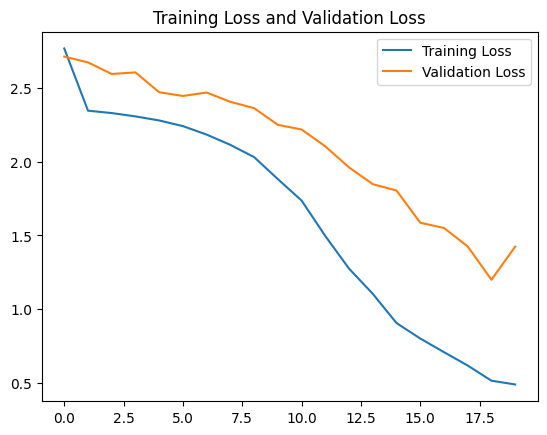

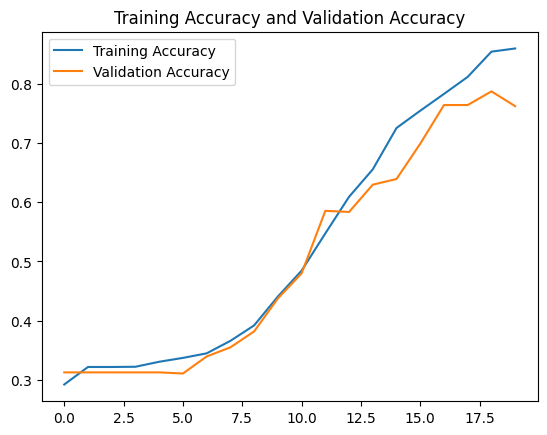

In [ ]:
accuracy = model_history.history['accuracy']
val_accuracy = model_history.history['val_accuracy']

loss = model_history.history['loss']
val_loss = model_history.history['val_loss']

epochs = range(len(accuracy))

plt.figure()
plt.plot(epochs, loss, label='Training Loss')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training Loss and Validation Loss')

plt.figure()
plt.plot(epochs, accuracy, label='Training Accuracy')
plt.plot(epochs, val_accuracy, label='Validation Accuracy')
plt.legend()
plt.title('Training Accuracy and Validation Accuracy')

plt.show()

### MODEL - Transfer Learning
There are two important points to be aware of in this case:

Data augmentation will run on-device, synchronously with the rest of the layers, and benefit from GPU acceleration.

When exporting the model using model.save, the preprocessing layers will be saved along with the rest of the model. If later this model is deployed, it will automatically standardize images (according to the configuration of layers). This can save the effort of having to reimplement that logic server-side.

Note: Data augmentation is inactive at test time so input images will only be augmented during calls to Model.fit (not Model.evaluate or Model.predict).

In [ ]:
base_model = ResNet50(
    weights='imagenet', # Load weights pre-trained on ImageNet
    input_shape=(224,224,3),
    include_top=False
)

# base_model.trainable = False    # Freeze the layers of the pre-trained ResNet50 model

base_model.trainable = True

# Fine-tune only the top layers
for layer in base_model.layers[:-10]:
    layer.trainable = False

In [ ]:
model_2 = Sequential([
  # data_augmentation,
  Rescaling(1./255),
  Resizing(img_height, img_width),

  base_model,       #resnet-50

  Dropout(0.5),

  # GlobalAveragePooling2D(),
  Flatten(),
  Dense(19, activation='softmax')                         # 19 classes for classification
])

In [ ]:
model_2.compile(
    optimizer='Adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
checkpoint_2_filepath = '/content/model_checkpoint_2'

model_2_checkpoint_callback = ModelCheckpoint(
    filepath=checkpoint_2_filepath,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True
)

In [ ]:
model_2_history = model_2.fit(
    training_ds,
    validation_data=val_ds,
    batch_size=32,
    epochs=100,
    callbacks=[model_2_checkpoint_callback]
)

Epoch 1/100
82/82 [==============================] - 42s 423ms/step - loss: 5.0041 - accuracy: 0.1959 - val_loss: 14.6980 - val_accuracy: 0.1094
Epoch 2/100
82/82 [==============================] - 33s 394ms/step - loss: 2.8280 - accuracy: 0.2361 - val_loss: 3.0845 - val_accuracy: 0.3186
Epoch 3/100
82/82 [==============================] - 14s 166ms/step - loss: 2.8804 - accuracy: 0.2411 - val_loss: 2.5249 - val_accuracy: 0.3167
Epoch 4/100
82/82 [==============================] - 34s 408ms/step - loss: 2.7706 - accuracy: 0.2522 - val_loss: 2.4030 - val_accuracy: 0.3225
Epoch 5/100
82/82 [==============================] - 33s 390ms/step - loss: 2.7549 - accuracy: 0.2660 - val_loss: 2.5379 - val_accuracy: 0.3417
Epoch 6/100
82/82 [==============================] - 32s 390ms/step - loss: 2.7009 - accuracy: 0.2790 - val_loss: 2.7936 - val_accuracy: 0.3474
Epoch 7/100
82/82 [==============================] - 33s 400ms/step - loss: 2.7023 - accuracy: 0.2748 - val_loss: 2.3834 - val_accuracy

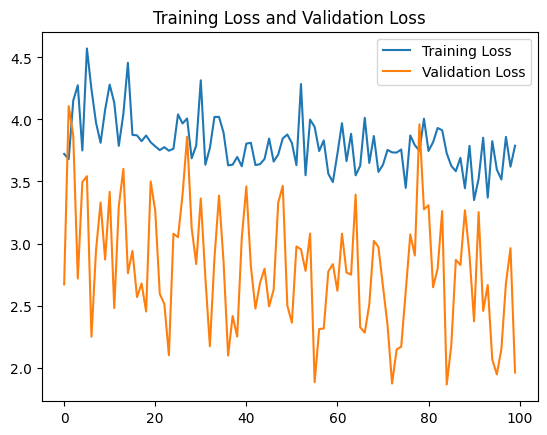

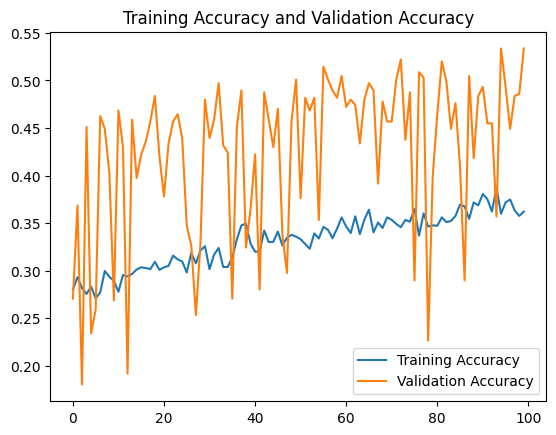

In [ ]:
accuracy = model_2_history.history['accuracy']
val_accuracy = model_2_history.history['val_accuracy']

loss = model_2_history.history['loss']
val_loss = model_2_history.history['val_loss']

epochs = range(len(accuracy))

plt.figure()
plt.plot(epochs, loss, label='Training Loss')
plt.plot(epochs, val_loss, label='Validation Loss')
plt.legend()
plt.title('Training Loss and Validation Loss')

plt.figure()
plt.plot(epochs, accuracy, label='Training Accuracy')
plt.plot(epochs, val_accuracy, label='Validation Accuracy')
plt.legend()
plt.title('Training Accuracy and Validation Accuracy')

plt.show()